In [1]:
import torch
import math
import torch.nn.functional as F

from dataset.semantic_segmentation_dataset import LoFiSemanticDataset

from model.custom_unet import UNetEncoder, UNetDecoder, UNetBottleneck
from model.location_encoder import LocationEncoder

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import cv2
import tqdm

import warnings
warnings.filterwarnings("ignore")

In [2]:
from config import cfg

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device: ", device)

Device:  cuda


In [4]:
class LoFiModel(torch.nn.Module):
    def __init__(self, cfg, device):
        super(LoFiModel, self).__init__()

        self.encoder = UNetEncoder(in_channels=cfg.DATA.IMAGE.CHANNELS)
        self.bottleneck = UNetBottleneck(in_channels=512+1)  #! 512 is the number of output channels from the encoder, 1 is the number of channels from the location encoder
        self.decoder = UNetDecoder(out_channels=1)

        self.location_encoder = LocationEncoder(embedding_size=1024)

        if cfg.MODEL.SSUL.CHECKPOINT_PATH:
            state_dict = torch.load(cfg.MODEL.SSUL.CHECKPOINT_PATH, map_location='cuda:0' )["state_dict"]
            unet_encoder_state_dict = {k.replace("encoder.", ""): v for k, v in state_dict.items() if k.startswith("encoder")}
            unet_bottleneck_state_dict = {k.replace("bottleneck.", ""): v for k, v in state_dict.items() if k.startswith("bottleneck")}
            unet_decoder_state_dict = {k.replace("decoder.", ""): v for k, v in state_dict.items() if k.startswith("decoder")}
            location_encoder_state_dict = {k.replace("location_encoder.", ""): v for k, v in state_dict.items() if k.startswith("location_encoder")}

            self.encoder.load_state_dict(unet_encoder_state_dict)
            self.bottleneck.load_state_dict(unet_bottleneck_state_dict)
            self.decoder.load_state_dict(unet_decoder_state_dict)
            self.location_encoder.load_state_dict(location_encoder_state_dict)
            
            
        self.device = device

        self.to(device)
    
    @torch.no_grad()
    def forward(self, image, gps):
        image = image.to(self.device)
        gps = gps.to(self.device)

        s1, s2, s3, s4, p4 = self.encoder(image)
        
        # Get the GPS features from the location encoder
        gps_embedding = self.location_encoder(gps)
        gps_embedding = F.normalize(gps_embedding, dim=1)
        gps_embedding = gps_embedding.reshape(image.shape[0], 1, 32, 32)
        
        p4 = torch.cat([p4, gps_embedding], axis=1)

        b = self.bottleneck(p4, gps)
        mask_logits = self.decoder(b, s1, s2, s3, s4)

        return mask_logits

In [5]:
model = LoFiModel(cfg, device)
model.eval()
print(model)

LoFiModel(
  (encoder): UNetEncoder(
    (e1): encoder_block(
      (conv): conv_block(
        (conv1): Conv2d(6, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU()
      )
      (pool): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    )
    (e2): encoder_block(
      (conv): conv_block(
        (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (

In [6]:
test_dataset = LoFiSemanticDataset(dataset_path=cfg.DATA.TEST_PATH)

In [7]:
test_dataset_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False)

  0%|          | 0/10823 [00:00<?, ?it/s]

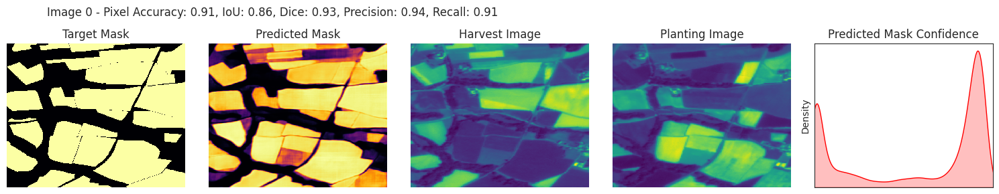

  0%|          | 1/10823 [00:03<10:13:01,  3.40s/it]

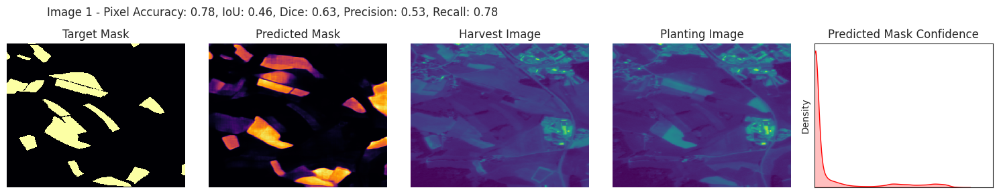

  0%|          | 2/10823 [00:06<9:02:51,  3.01s/it] 

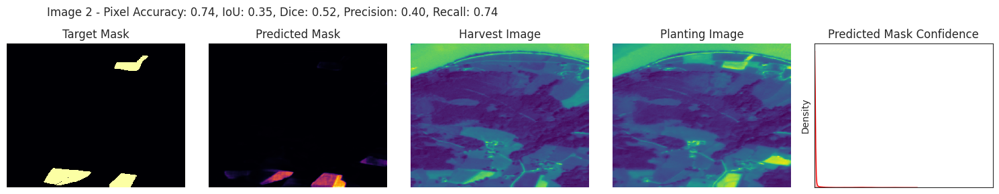

  0%|          | 3/10823 [00:09<9:47:13,  3.26s/it]

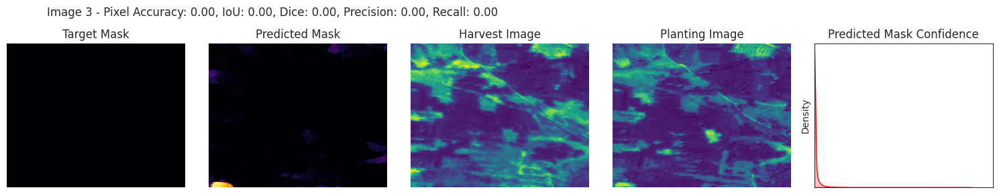

  0%|          | 4/10823 [00:13<10:10:45,  3.39s/it]

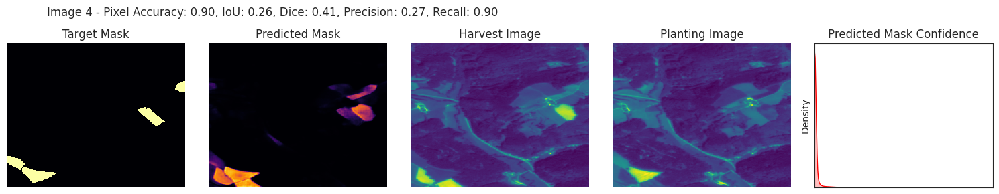

  0%|          | 5/10823 [00:16<10:09:15,  3.38s/it]

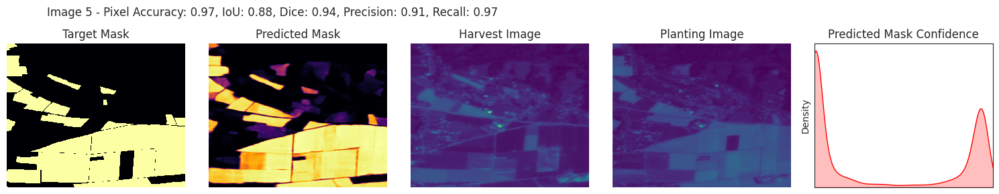

  0%|          | 6/10823 [00:19<9:09:11,  3.05s/it] 

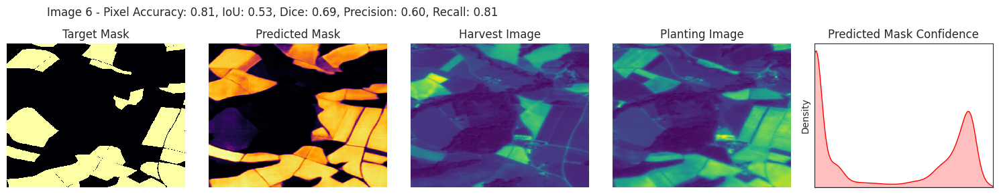

  0%|          | 7/10823 [00:21<8:29:16,  2.83s/it]

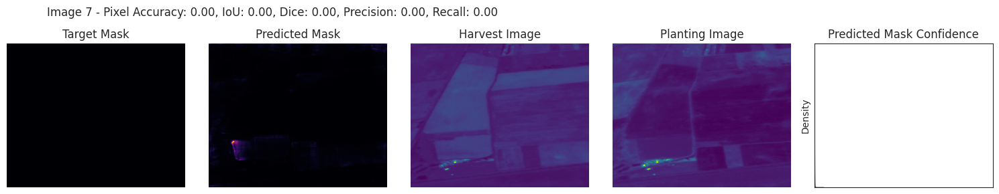

  0%|          | 8/10823 [00:25<9:21:43,  3.12s/it]

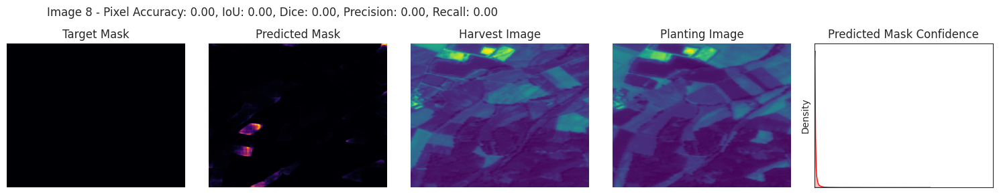

  0%|          | 9/10823 [00:28<10:01:20,  3.34s/it]

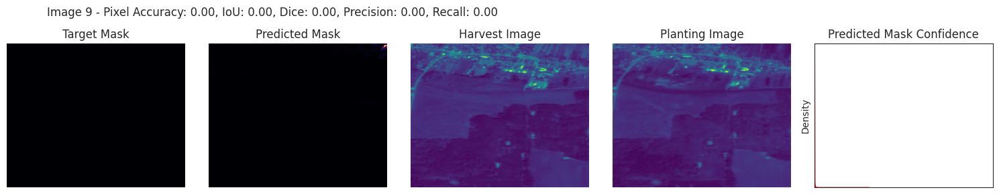

  0%|          | 10/10823 [00:32<10:13:57,  3.41s/it]

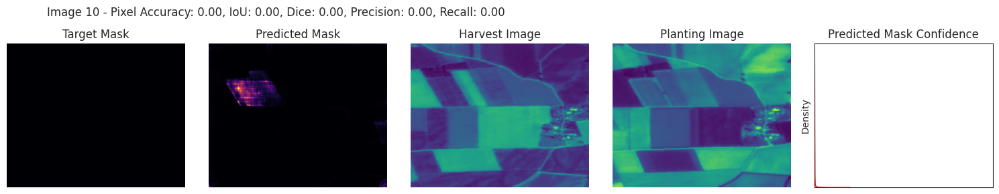

  0%|          | 11/10823 [00:36<10:21:04,  3.45s/it]

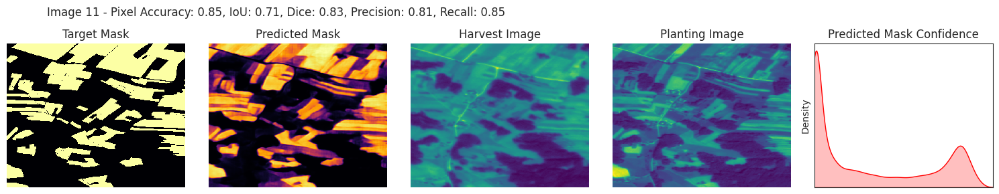

  0%|          | 12/10823 [00:38<9:28:10,  3.15s/it] 

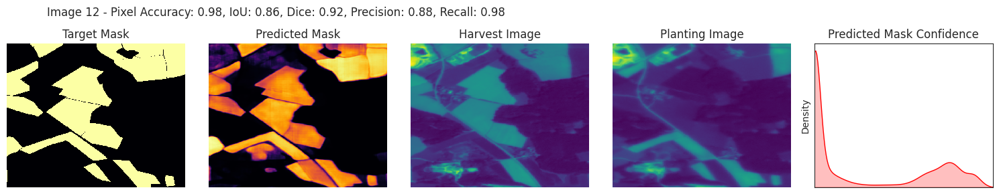

  0%|          | 13/10823 [00:41<9:03:59,  3.02s/it]

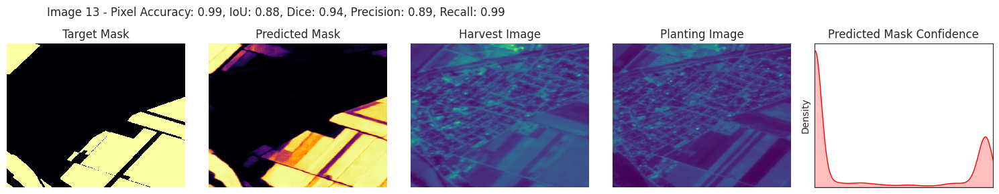

  0%|          | 14/10823 [00:43<8:29:57,  2.83s/it]

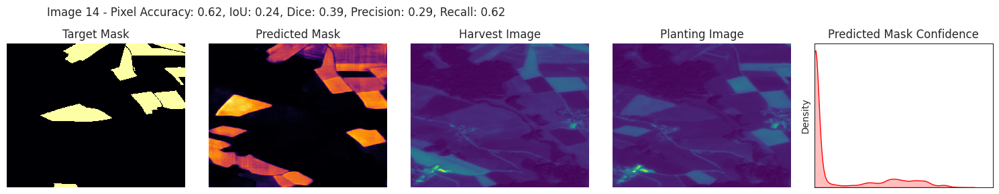

  0%|          | 15/10823 [00:46<8:19:05,  2.77s/it]

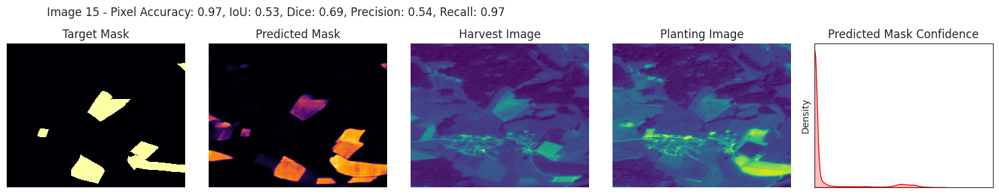

  0%|          | 16/10823 [00:49<8:19:54,  2.78s/it]

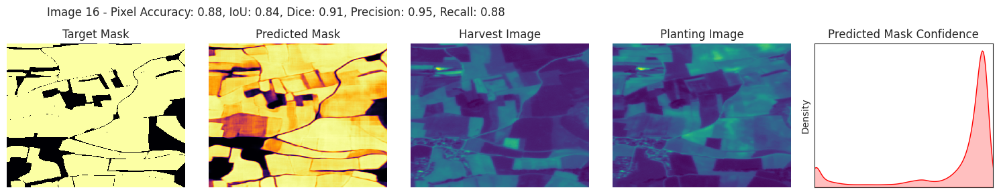

  0%|          | 17/10823 [00:51<8:12:22,  2.73s/it]

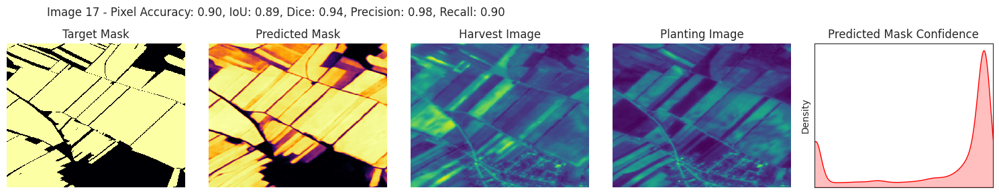

  0%|          | 18/10823 [00:54<7:55:35,  2.64s/it]

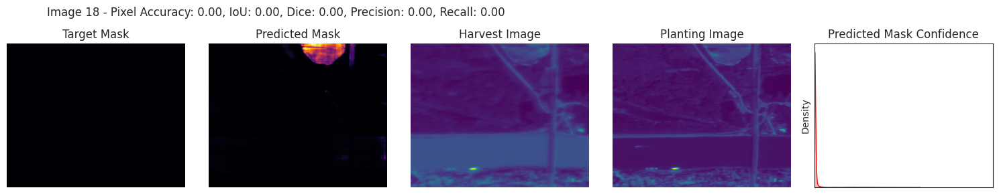

  0%|          | 19/10823 [00:57<8:23:32,  2.80s/it]

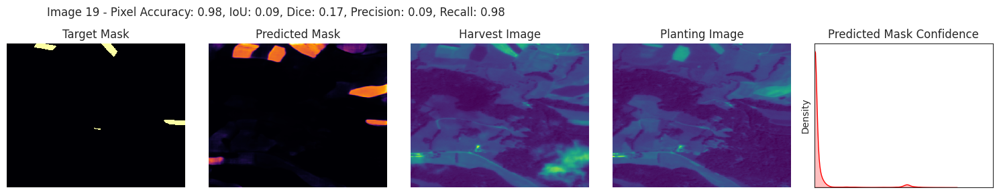

  0%|          | 20/10823 [00:59<8:17:50,  2.77s/it]

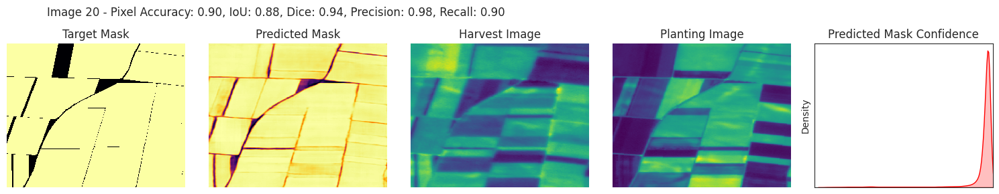

  0%|          | 21/10823 [01:03<8:43:12,  2.91s/it]

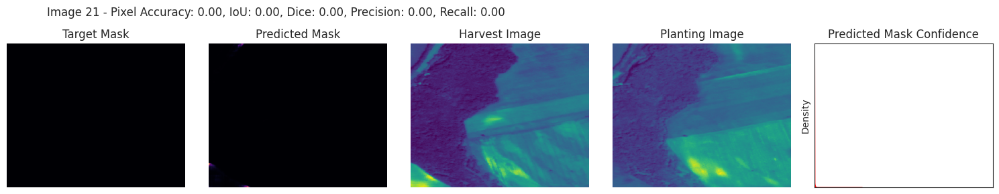

  0%|          | 22/10823 [01:06<9:20:23,  3.11s/it]

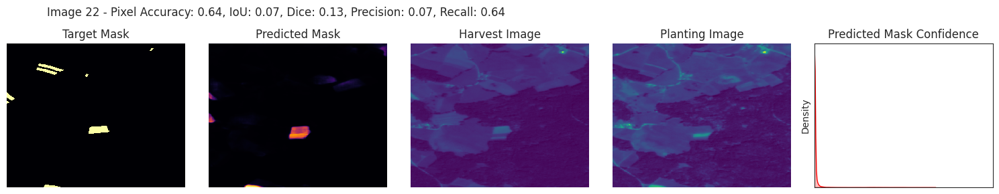

  0%|          | 23/10823 [01:10<9:51:44,  3.29s/it]

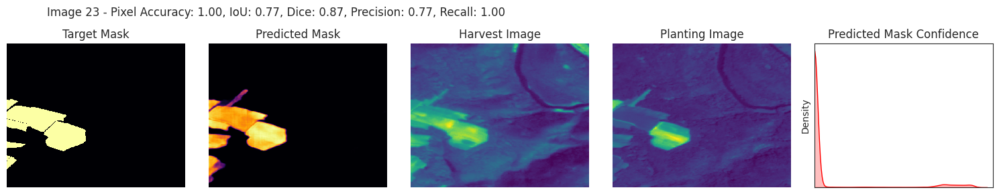

  0%|          | 24/10823 [01:13<9:26:54,  3.15s/it]

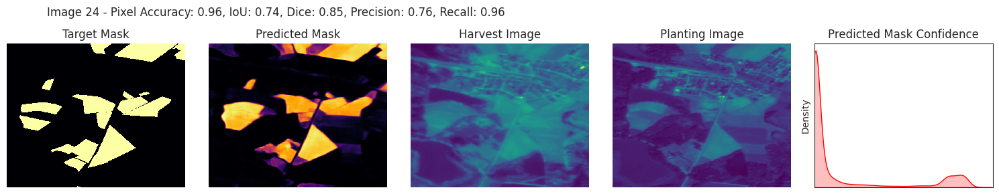

  0%|          | 25/10823 [01:16<9:08:30,  3.05s/it]

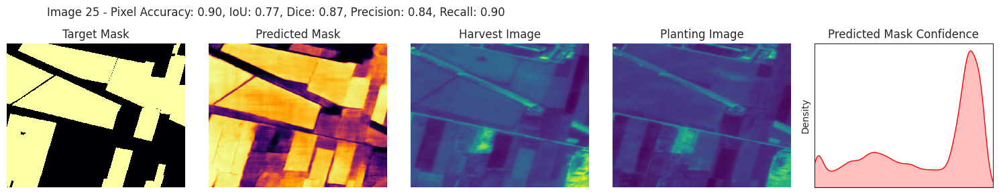

  0%|          | 26/10823 [01:18<8:42:21,  2.90s/it]

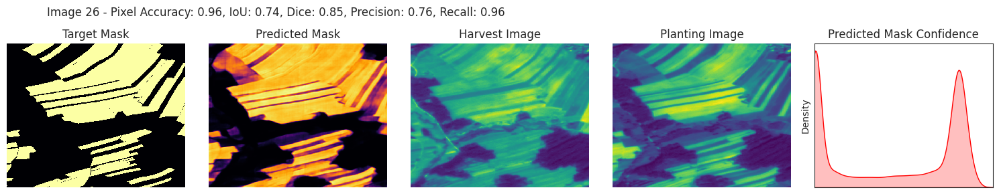

  0%|          | 27/10823 [01:21<8:20:20,  2.78s/it]

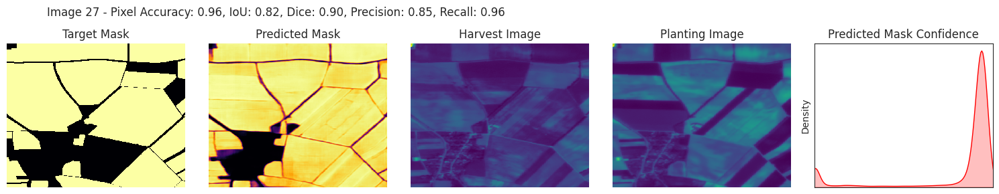

  0%|          | 28/10823 [01:23<8:09:34,  2.72s/it]

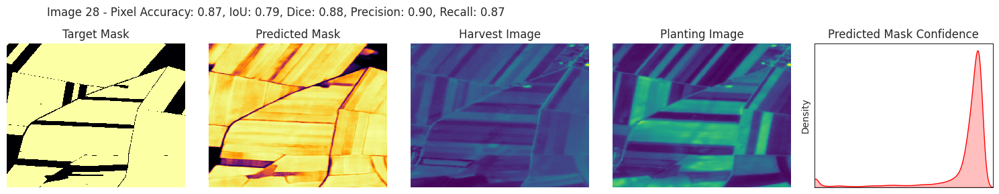

  0%|          | 29/10823 [01:26<8:25:29,  2.81s/it]

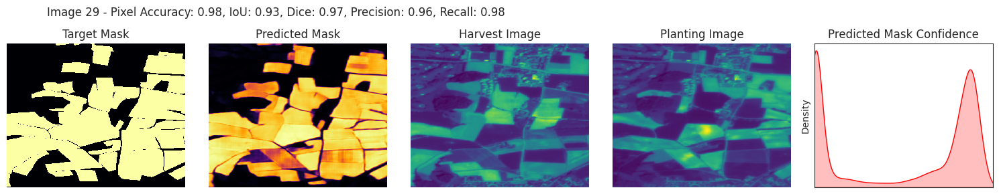

  0%|          | 30/10823 [01:29<8:11:32,  2.73s/it]

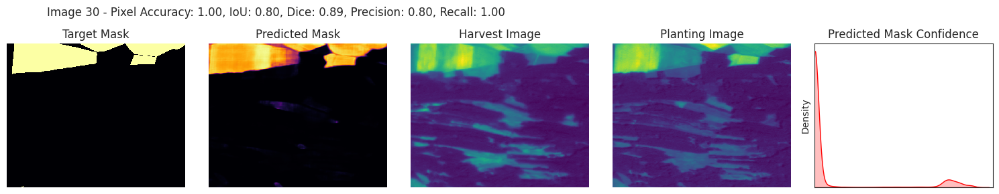

  0%|          | 31/10823 [01:32<8:19:48,  2.78s/it]

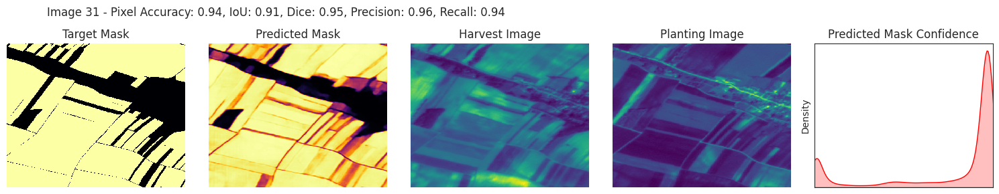

  0%|          | 32/10823 [01:34<8:10:58,  2.73s/it]

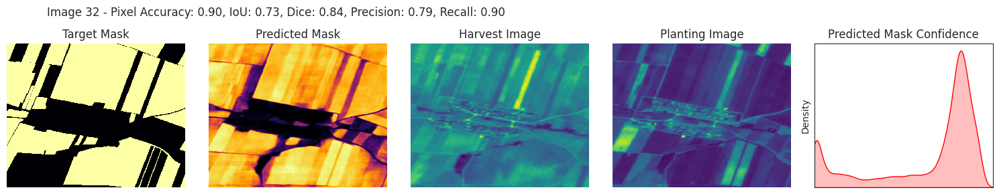

  0%|          | 33/10823 [01:37<8:16:57,  2.76s/it]

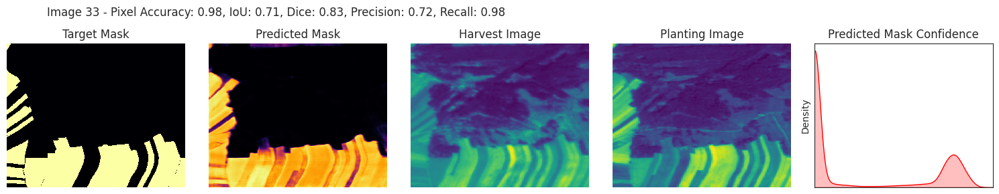

  0%|          | 34/10823 [01:40<8:24:40,  2.81s/it]

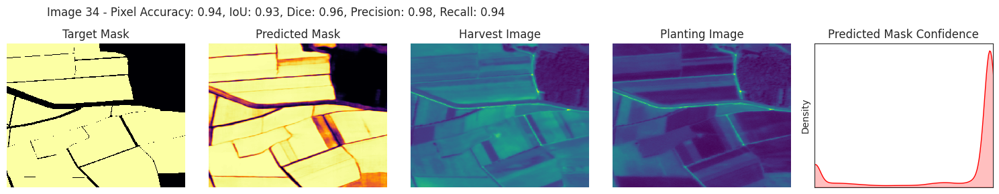

  0%|          | 35/10823 [01:43<8:13:50,  2.75s/it]

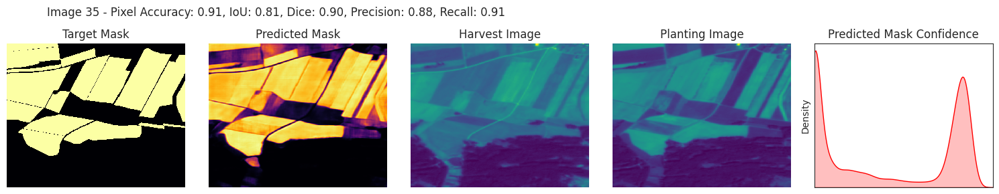

  0%|          | 36/10823 [01:45<8:04:30,  2.69s/it]

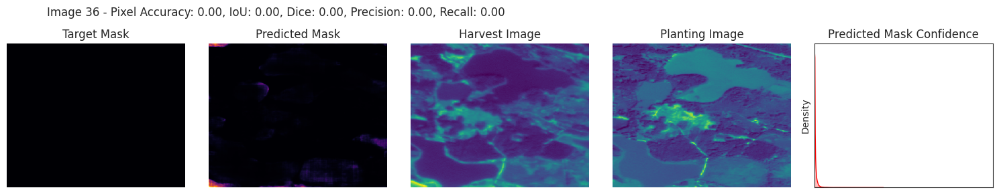

  0%|          | 37/10823 [01:49<9:01:11,  3.01s/it]

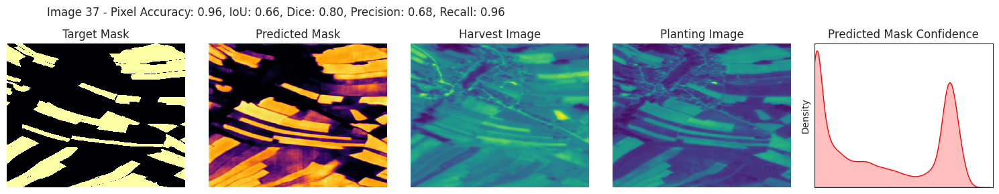

  0%|          | 38/10823 [01:52<8:39:18,  2.89s/it]

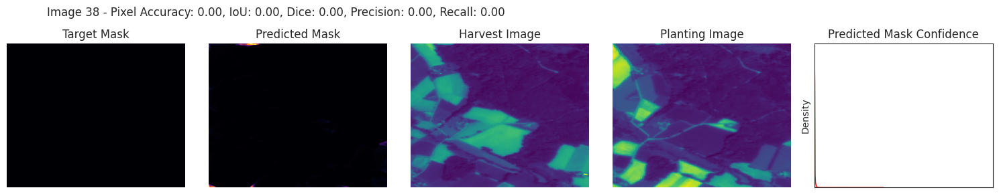

  0%|          | 39/10823 [01:55<9:24:16,  3.14s/it]

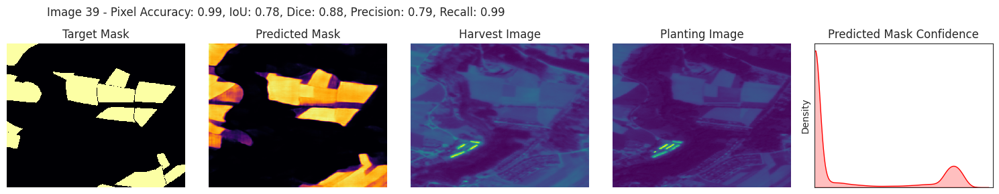

  0%|          | 40/10823 [01:58<8:51:42,  2.96s/it]

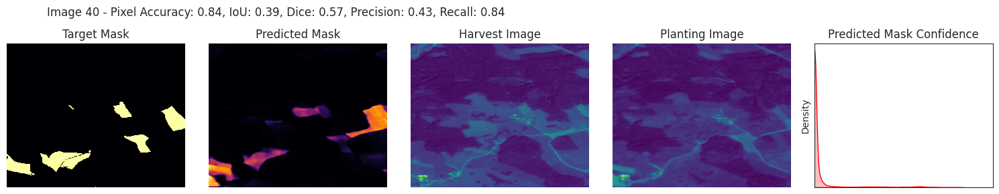

  0%|          | 41/10823 [02:01<8:55:29,  2.98s/it]

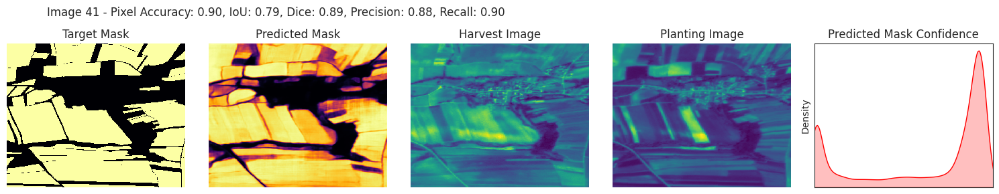

  0%|          | 42/10823 [02:04<8:36:24,  2.87s/it]

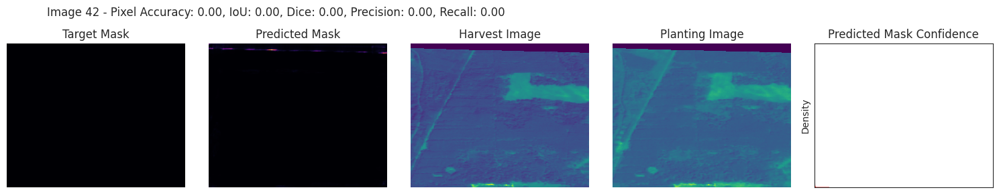

  0%|          | 43/10823 [02:07<9:28:31,  3.16s/it]

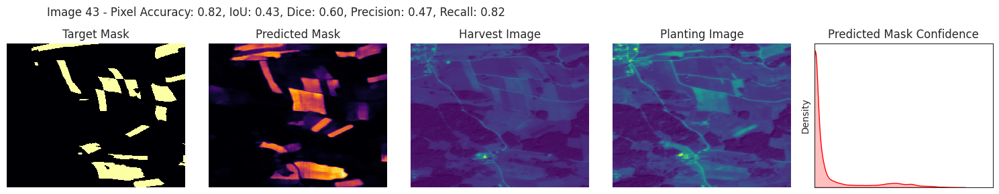

  0%|          | 44/10823 [02:10<9:19:13,  3.11s/it]

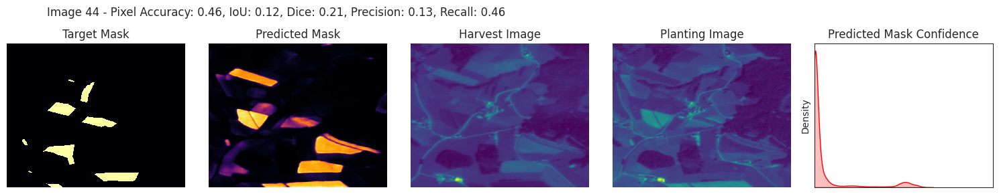

  0%|          | 45/10823 [02:13<9:07:08,  3.05s/it]

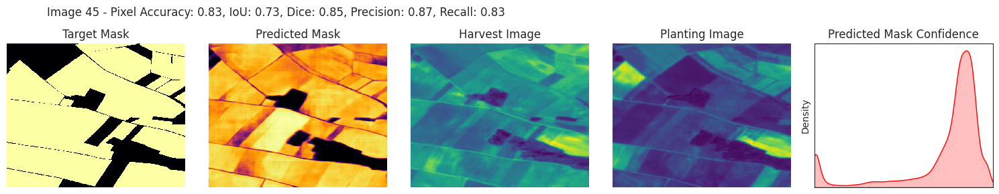

  0%|          | 46/10823 [02:16<8:52:18,  2.96s/it]

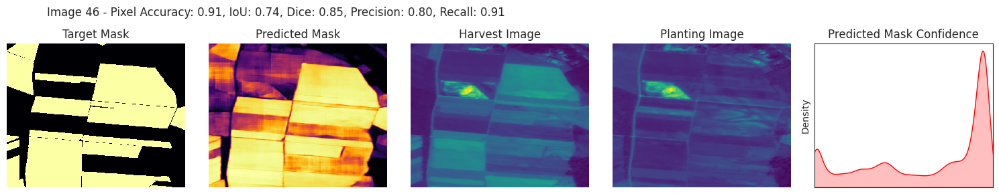

  0%|          | 47/10823 [02:19<8:27:18,  2.82s/it]

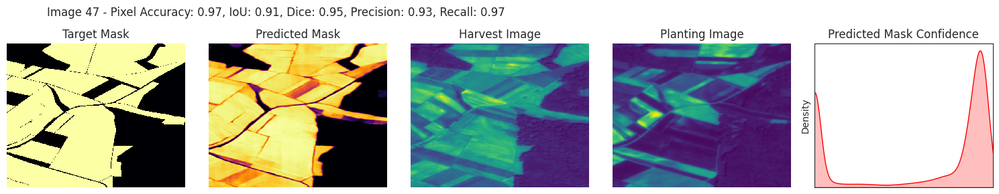

  0%|          | 48/10823 [02:21<8:07:02,  2.71s/it]

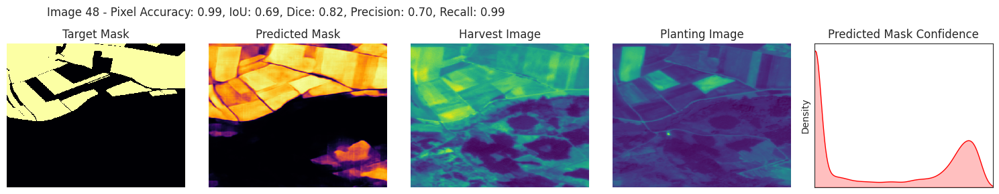

  0%|          | 49/10823 [02:24<7:55:03,  2.65s/it]

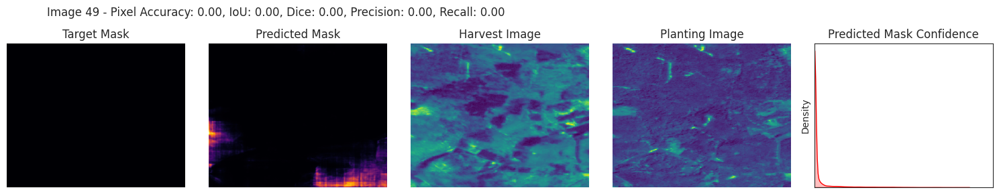

  0%|          | 50/10823 [02:27<8:48:12,  2.94s/it]

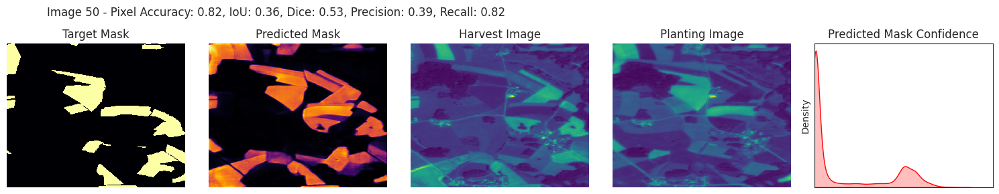

100%|██████████| 10823/10823 [16:34<00:00, 10.88it/s]


In [8]:
i = 0

pixel_accuracies = []
ious = []
dice_coefficients = []
precisions = []
recalls = []

pred_means = []
pred_stds = []
pred_maxs = []
pred_mins = []

for (image, gps, target_masks) in tqdm.tqdm(test_dataset_loader):
    predicted_masks = model(image, gps)
    
    predicted_masks = predicted_masks.detach().cpu().numpy().squeeze()
    target_masks = target_masks.detach().cpu().numpy().squeeze()

    #get the mean and std of the predicted masks
    pred_mean = np.mean(predicted_masks)
    pred_std = np.std(predicted_masks)
    pred_min = np.min(predicted_masks)
    pred_max = np.max(predicted_masks)
    predicted_masks_binary = np.where(predicted_masks > pred_mean, 1, 0).astype(np.uint8)

    harvest_image = image.squeeze()[0:3, :, :].detach().cpu().numpy().transpose(1, 2, 0)
    planting_image = image.squeeze()[3:6, :, :].detach().cpu().numpy().transpose(1, 2, 0)

    #convert to GRAYScale
    harvest_image = cv2.cvtColor(harvest_image, cv2.COLOR_BGR2GRAY)
    planting_image = cv2.cvtColor(planting_image, cv2.COLOR_BGR2GRAY)
    predicted_masks_gray = predicted_masks * 255
    target_masks_gray = target_masks * 255


    #calculate the intersection over union
    intersection = np.logical_and(target_masks, predicted_masks_binary)
    union = np.logical_or(target_masks, predicted_masks_binary)
    iou_score = np.sum(intersection) / np.sum(union)
    
    #Calculate the dice coefficient
    dice_coefficient = (2 * np.sum(intersection)) / (np.sum(target_masks) + np.sum(predicted_masks_binary))

    #calculate the pixel accuracy
    pixel_accuracy = np.sum(intersection) / np.sum(target_masks)

    #calculate the precision and recall
    precision = np.sum(intersection) / np.sum(predicted_masks_binary)
    recall = np.sum(intersection) / np.sum(target_masks)

    # Check if any value is nan
    if math.isnan(pixel_accuracy):
        pixel_accuracy = 0.0
    if math.isnan(iou_score):
        iou_score = 0.0
    if math.isnan(dice_coefficient):
        dice_coefficient = 0.0
    if math.isnan(precision):
        precision = 0.0
    if math.isnan(recall):
        recall = 0.0

    pixel_accuracies.append(pixel_accuracy)
    dice_coefficients.append(dice_coefficient)
    ious.append(iou_score)
    precisions.append(precision)
    recalls.append(recall)
    pred_means.append(pred_mean)
    pred_stds.append(pred_std)
    pred_maxs.append(pred_max)
    pred_mins.append(pred_min)
    
    if i <= 50:
        sns.set_style("white")  # Set white background for better visualization

        fig, axes = plt.subplots(1, 5, figsize=(15, 3))  # Create 2x3 grid for better layout

        # Plot target and predicted masks
        sns.heatmap(target_masks, cmap="inferno", ax=axes[0], cbar=False)
        axes[0].set_title("Target Mask")
        axes[0].set_xticks([])
        axes[0].set_yticks([])

        sns.heatmap(predicted_masks, cmap="inferno", ax=axes[1], cbar=False)
        axes[1].set_title("Predicted Mask")
        axes[1].set_xticks([])
        axes[1].set_yticks([])

        # Plot harvest and planting images
        sns.heatmap(harvest_image, cmap="viridis", ax=axes[2], cbar=False)
        axes[2].set_title("Harvest Image")
        axes[2].set_xticks([])
        axes[2].set_yticks([])

        sns.heatmap(planting_image, cmap="viridis", ax=axes[3], cbar=False)
        axes[3].set_title("Planting Image")
        axes[3].set_xticks([])
        axes[3].set_yticks([])

        # Plot confidence score distribution
        sns.kdeplot(data=predicted_masks.flatten(), color="red", shade=True, ax=axes[4])  # Use shade for filled distribution
        axes[4].set_title("Predicted Mask Confidence")
        axes[4].set_xlim(0, 1)
        axes[4].set_xticks([])
        axes[4].set_yticks([])

        # Add suptitle
        plt.suptitle(f"Image {i} - Pixel Accuracy: {pixel_accuracy:.2f}, IoU: {iou_score:.2f}, Dice: {dice_coefficient:.2f}, Precision: {precision:.2f}, Recall: {recall:.2f}", x=0.05, y=0.95, ha='left')  # Adjust y position for better placement

        plt.tight_layout()  # Adjust spacing between subplots
        plt.show()

    # else:
    #     break
    i += 1

In [9]:
print(f"Mean Pixel Accuracy: {round(np.mean(pixel_accuracies) * 100, 2)}%, len: {len(pixel_accuracies)}")
print(f"Mean IoU: {round(np.mean(ious) * 100, 2)}%, len: {len(ious)}")
print(f"Mean Dice Coefficient: {round(np.mean(dice_coefficients) * 100, 2)}%, len: {len(dice_coefficients)}")
print(f"Mean Precision: {round(np.mean(precisions) * 100, 2)}%, len: {len(precisions)}")
print(f"Mean Recall: {round(np.mean(recalls) * 100, 2)}%, len: {len(recalls)}")

Mean Pixel Accuracy: 75.26%, len: 10823
Mean IoU: 56.48%, len: 10823
Mean Dice Coefficient: 63.62%, len: 10823
Mean Precision: 60.91%, len: 10823
Mean Recall: 75.26%, len: 10823


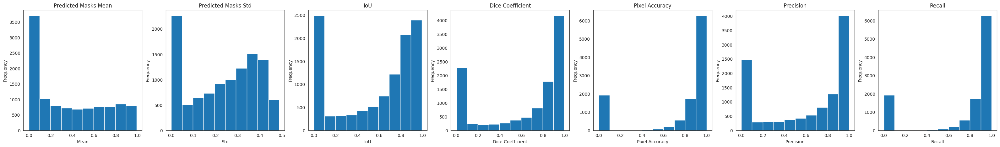

In [10]:
# plot the distribution of the predicted means, stds, maxs and mins, pixel accuracies, ious, dice coefficients and lpips distances
plt.subplots(1, 7, figsize=(40, 5))
plt.subplot(1, 7, 1)
plt.hist(pred_means)
plt.title("Predicted Masks Mean")
plt.xlabel("Mean")
plt.ylabel("Frequency")

plt.subplot(1, 7, 2)
plt.hist(pred_stds)
plt.title("Predicted Masks Std")
plt.xlabel("Std")
plt.ylabel("Frequency")

plt.subplot(1, 7, 3)
plt.hist(ious)
plt.title("IoU")
plt.xlabel("IoU")
plt.ylabel("Frequency")

plt.subplot(1, 7, 4)
plt.hist(dice_coefficients)
plt.title("Dice Coefficient")
plt.xlabel("Dice Coefficient")
plt.ylabel("Frequency")

plt.subplot(1, 7, 5)
plt.hist(pixel_accuracies)
plt.title("Pixel Accuracy")
plt.xlabel("Pixel Accuracy")
plt.ylabel("Frequency")

plt.subplot(1, 7, 6)
plt.hist(precisions)
plt.title("Precision")
plt.xlabel("Precision")
plt.ylabel("Frequency")

plt.subplot(1, 7, 7)
plt.hist(recalls)
plt.title("Recall")
plt.xlabel("Recall")
plt.ylabel("Frequency")

plt.show()